In [1]:
import sys
sys.path.append('../../')

In [2]:
from scripts.utils import data_path, set_mpl, read_hamelin, add_datetime_features, read_london, read_trentino
from scripts.calendar import timeanddate_calendar
from scripts.google_trends import download_google_trends

matplotlib settings set


In [3]:
import pandas as pd
import numpy as np

import seaborn as sns; sns.set()
import matplotlib.pyplot as plt

import os
import tqdm
import requests
from datetime import datetime, timedelta
import time

from sklearn.metrics import r2_score
from sklearn.metrics import mean_absolute_error
from sklearn import preprocessing

import lightgbm as lgb

from pytrends.request import TrendReq

In [4]:
london_std, london_tou, london_weather = read_london()


    Loading London data from C:\Users\user\swarm_energAIser/0_data/.
    Weather from `meteostat` package.

    STD and ToU tariffs are separated.
    Data resampled (mean) to 1H resolution from original 30min resolution.

    reutrns:
    df_std: pd.DataFrame with STD tariff data
    df_tou: pd.DataFrame with ToU tariff data
    df_weather: pd.DataFrame with weather data
    
    


GB/Excel/Microsoft Excel


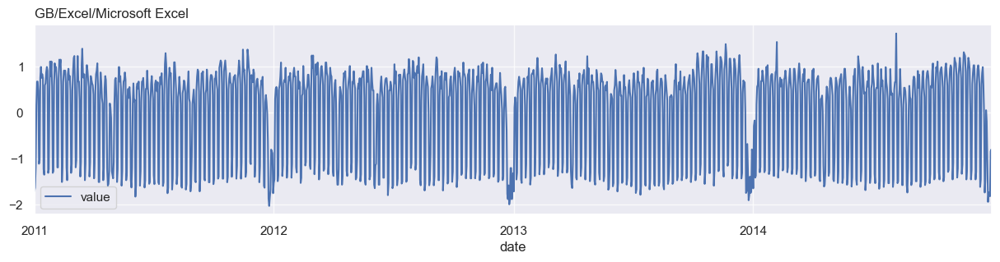

successful
----------------------------------------------------------------------------------------------------
GB/Excel/Formula


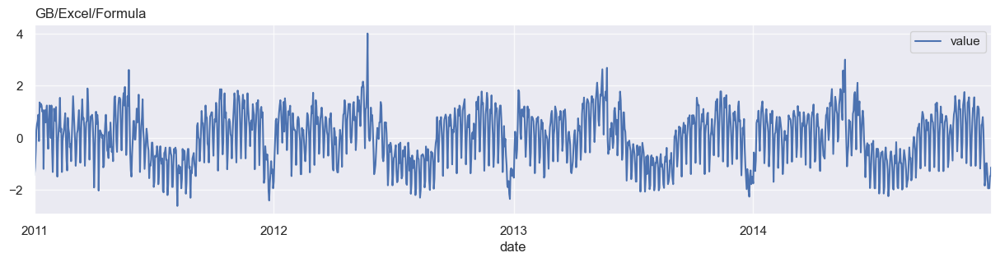

successful
----------------------------------------------------------------------------------------------------
GB/Excel/Cell


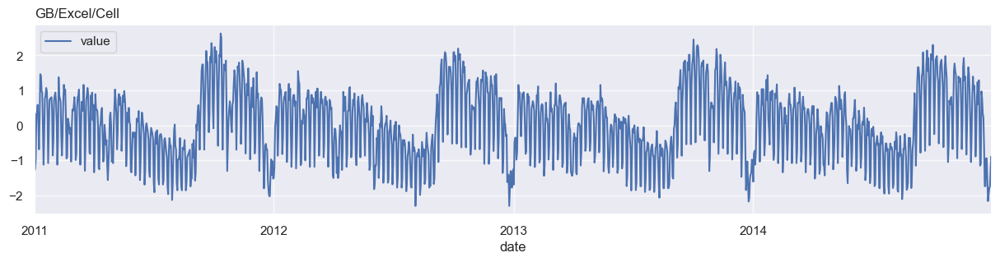

successful
----------------------------------------------------------------------------------------------------
GB/Excel/PDF


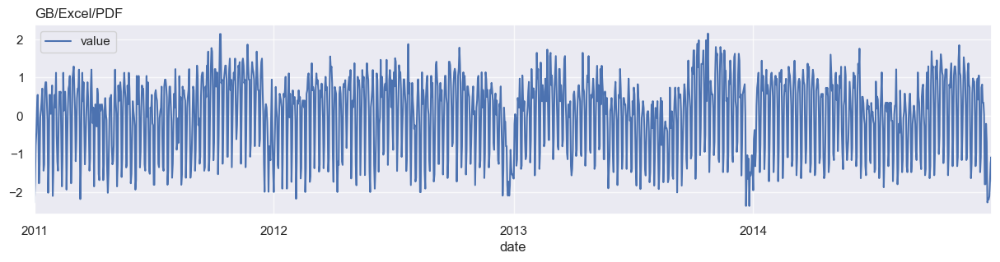

successful
----------------------------------------------------------------------------------------------------
GB/Excel/Data


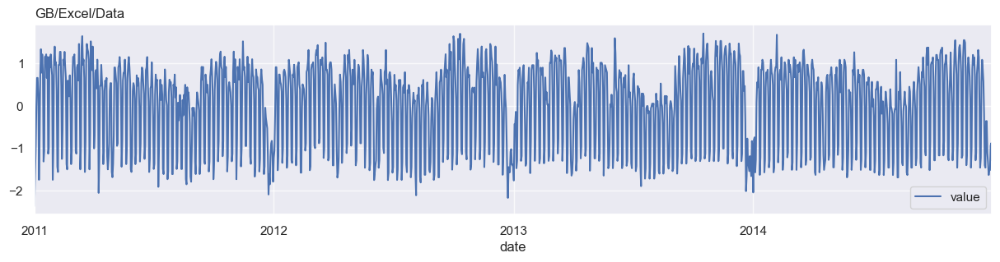

successful
----------------------------------------------------------------------------------------------------
GB/Excel/Computer file


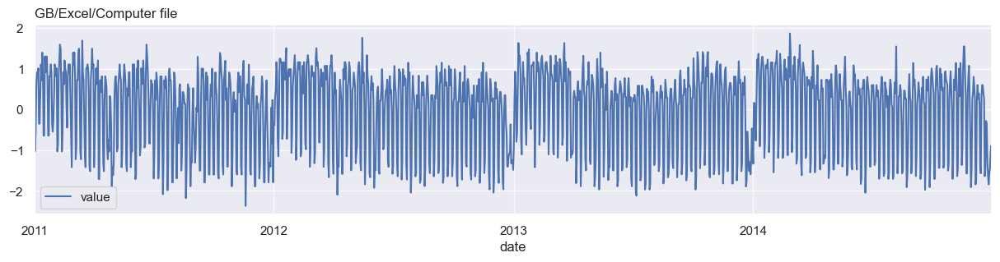

successful
----------------------------------------------------------------------------------------------------
GB/Excel/Function


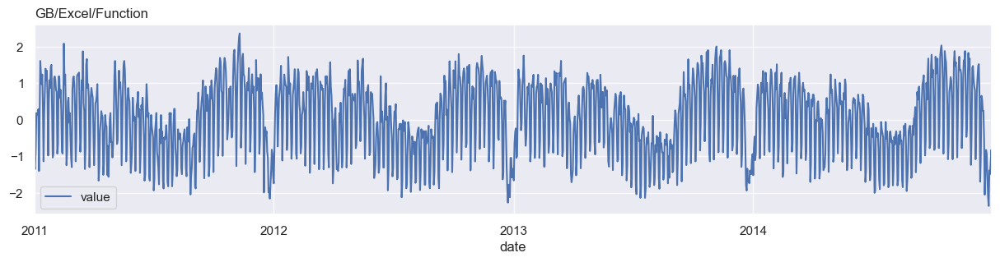

successful
----------------------------------------------------------------------------------------------------
GB/Excel/Column


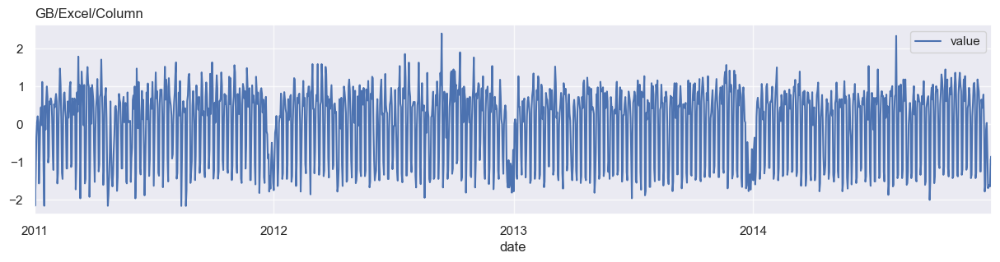

successful
----------------------------------------------------------------------------------------------------
GB/Excel/Chart


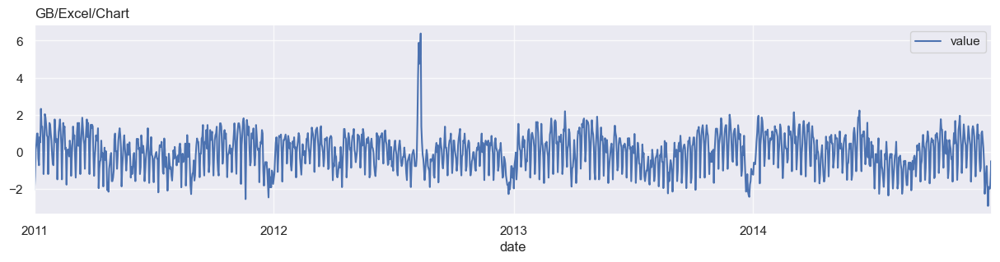

successful
----------------------------------------------------------------------------------------------------
GB/Excel/Table


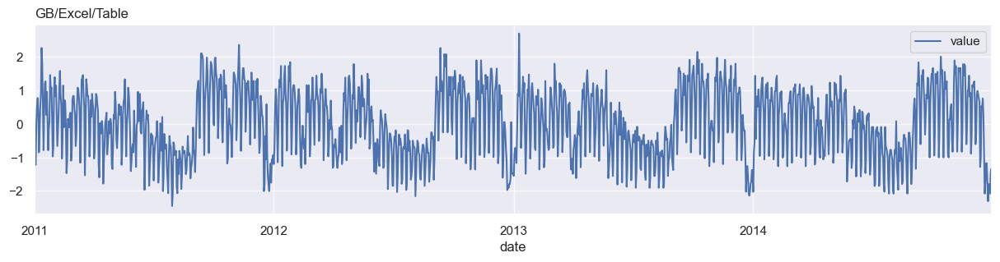

successful
----------------------------------------------------------------------------------------------------
GB/Excel/Row


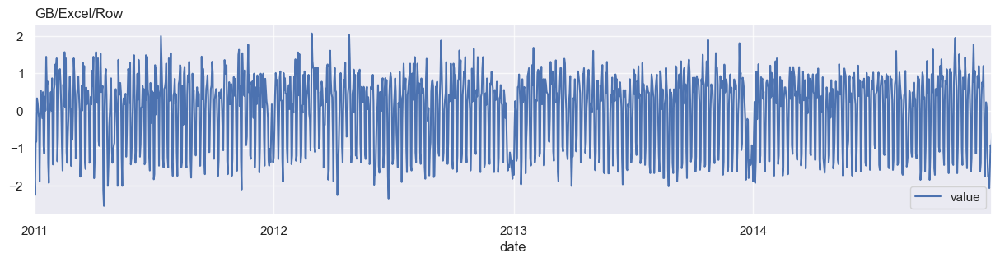

successful
----------------------------------------------------------------------------------------------------
GB/Excel/Microsoft Corporation


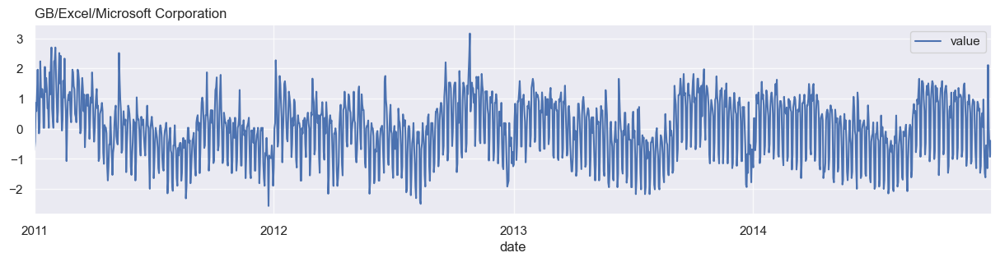

successful
----------------------------------------------------------------------------------------------------
GB/Excel/Visual Basic for Applications


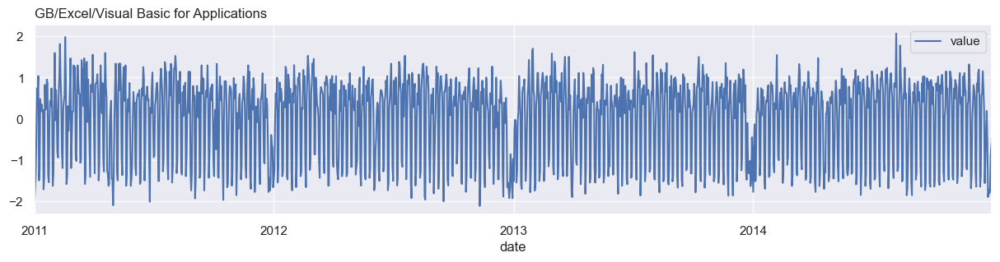

successful
----------------------------------------------------------------------------------------------------
GB/Excel/Calendar date


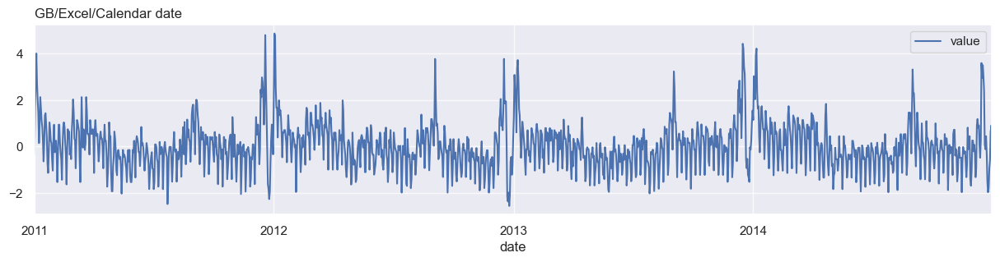

successful
----------------------------------------------------------------------------------------------------
GB/Excel/Calculation


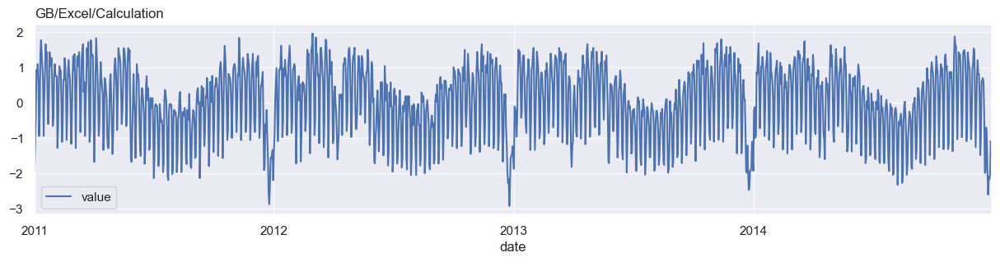

successful
----------------------------------------------------------------------------------------------------
GB/Excel/Microsoft Word


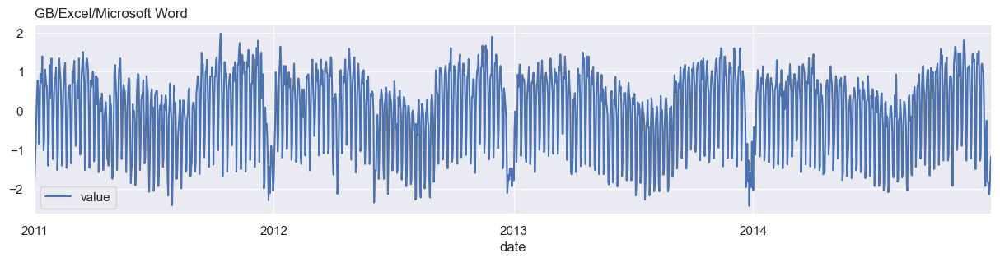

successful
----------------------------------------------------------------------------------------------------
GB/Excel/Spreadsheet


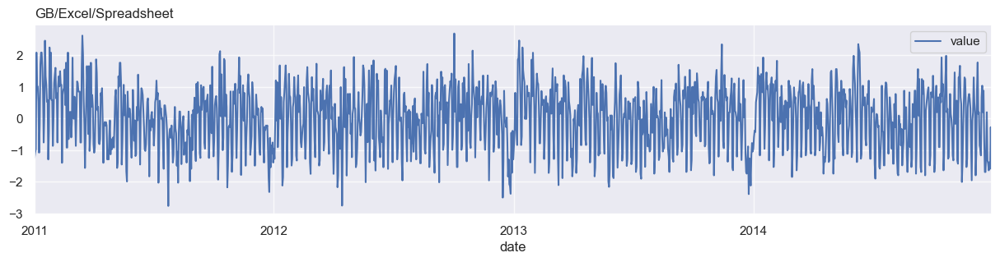

successful
----------------------------------------------------------------------------------------------------
GB/Excel/File format


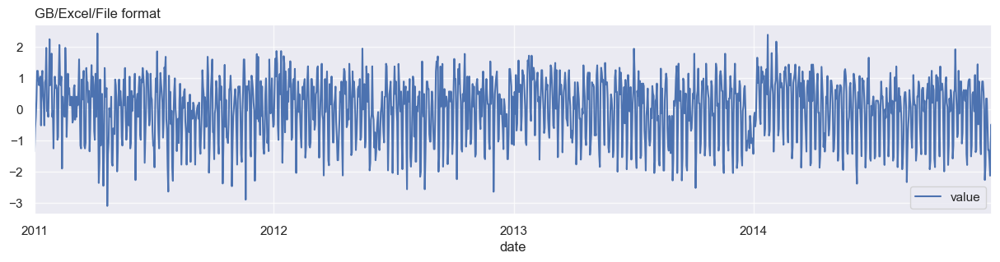

successful
----------------------------------------------------------------------------------------------------
GB/Excel/Drum


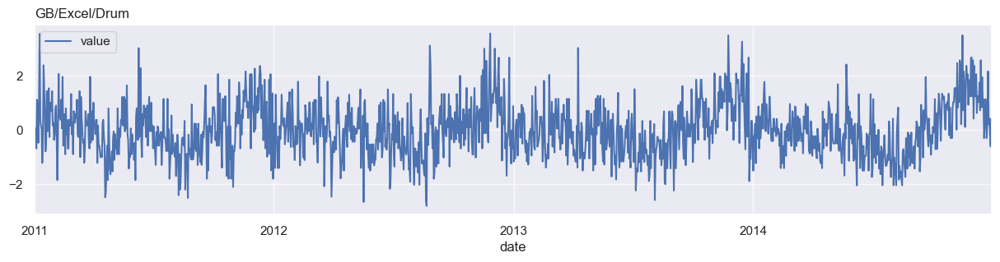

successful
----------------------------------------------------------------------------------------------------
GB/Excel/List


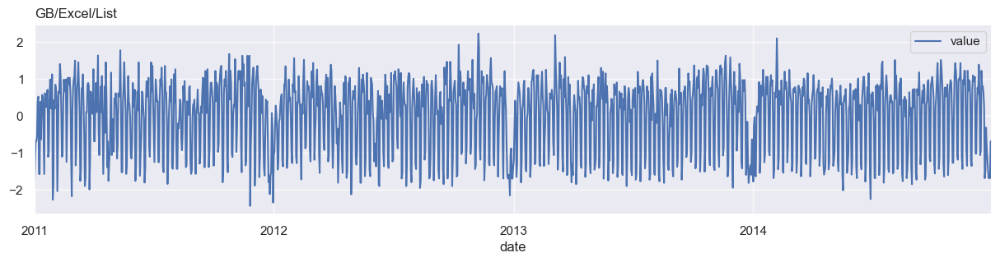

successful
----------------------------------------------------------------------------------------------------
GB/Excel/Drop-down list


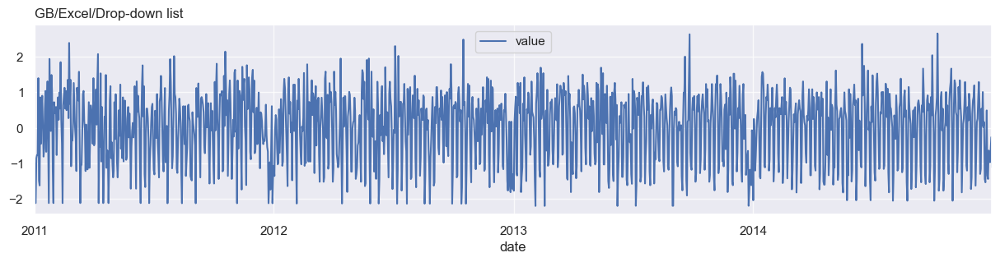

successful
----------------------------------------------------------------------------------------------------
GB/Excel/Google Sheets


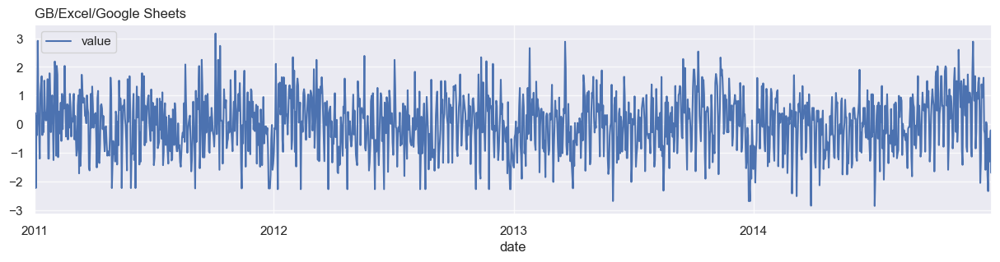

successful
----------------------------------------------------------------------------------------------------
GB/Excel/Macro


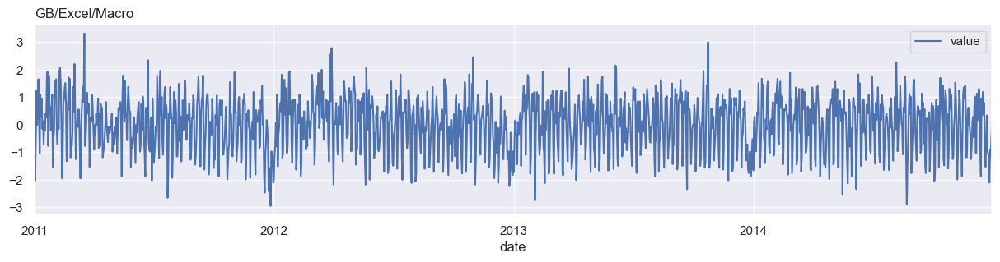

successful
----------------------------------------------------------------------------------------------------
GB/Excel/Keyboard shortcut


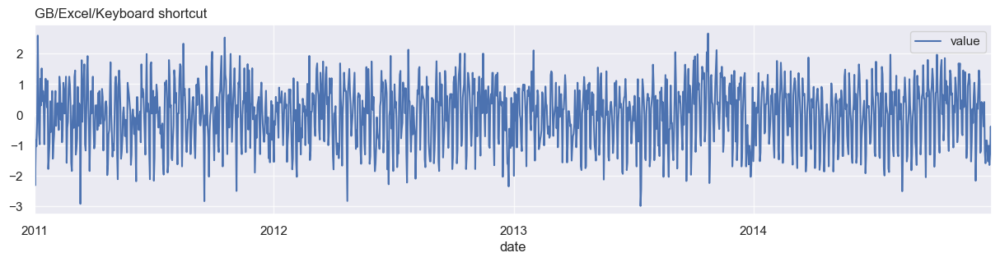

successful
----------------------------------------------------------------------------------------------------
GB/Excel/Counting


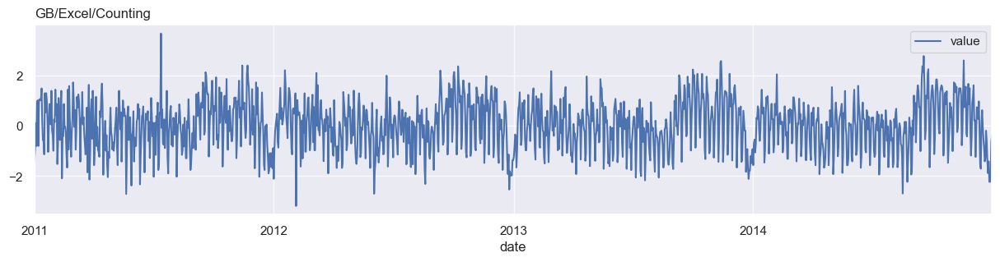

successful
----------------------------------------------------------------------------------------------------
GB/Education/Education


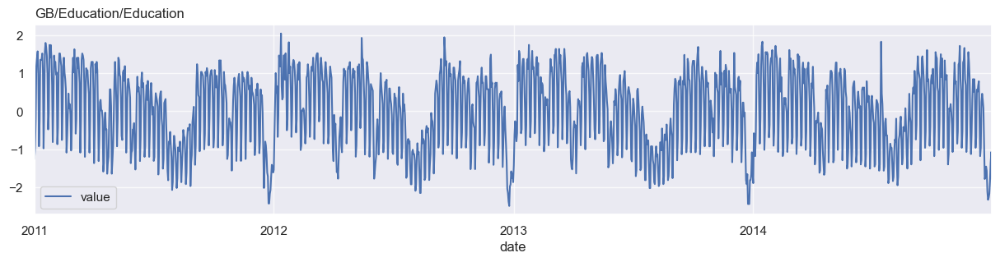

successful
----------------------------------------------------------------------------------------------------
GB/Education/Sex Education


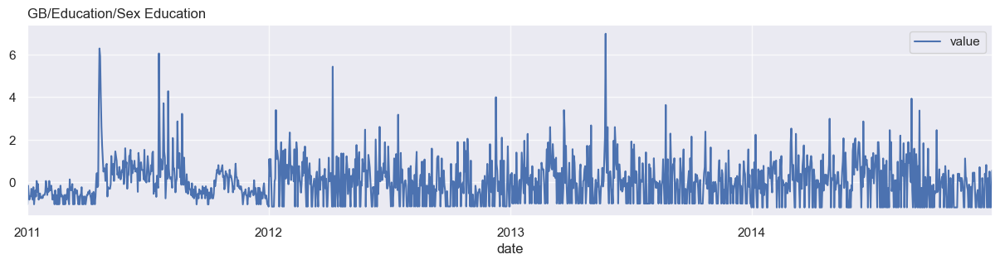

successful
----------------------------------------------------------------------------------------------------
GB/Education/Higher education


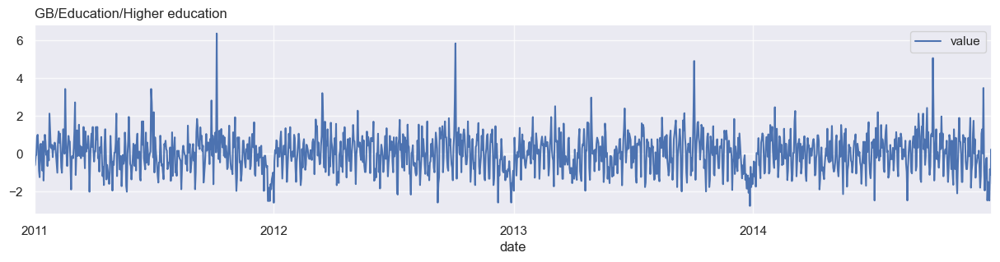

successful
----------------------------------------------------------------------------------------------------
GB/Education/Teacher


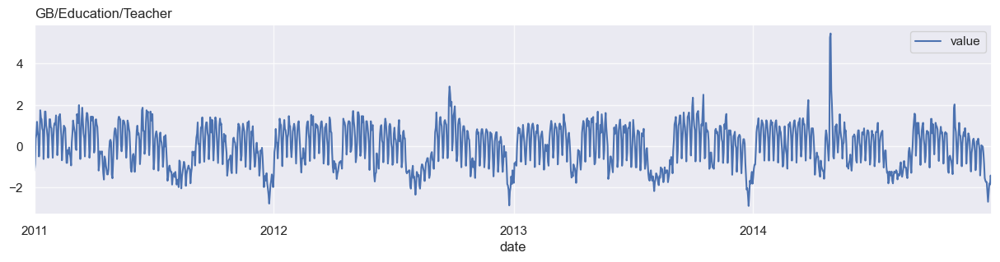

successful
----------------------------------------------------------------------------------------------------
GB/Education/College


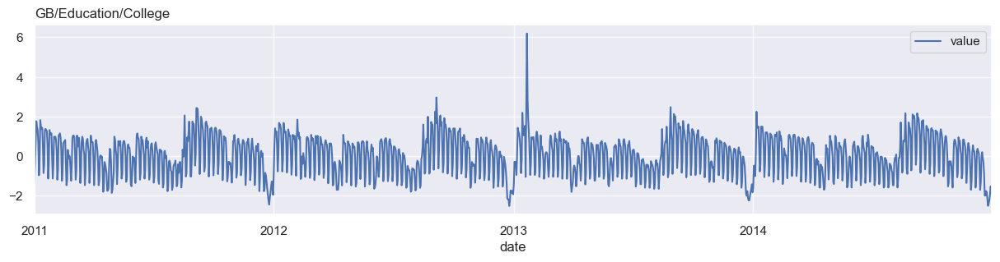

successful
----------------------------------------------------------------------------------------------------
GB/Education/Student


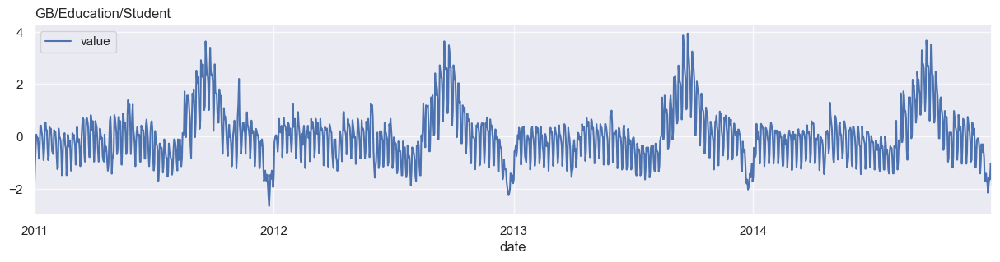

successful
----------------------------------------------------------------------------------------------------
GB/Education/Physical education


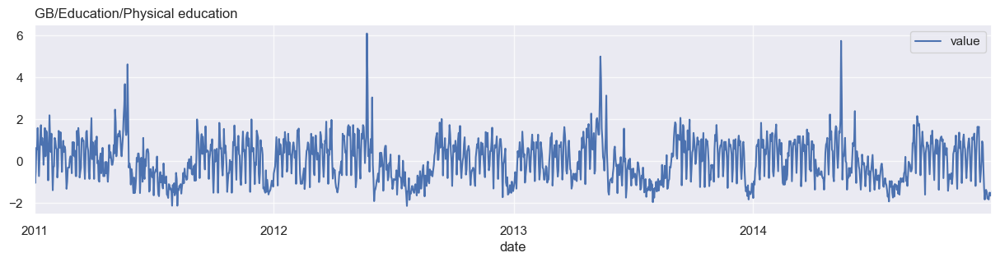

successful
----------------------------------------------------------------------------------------------------
GB/Education/Course


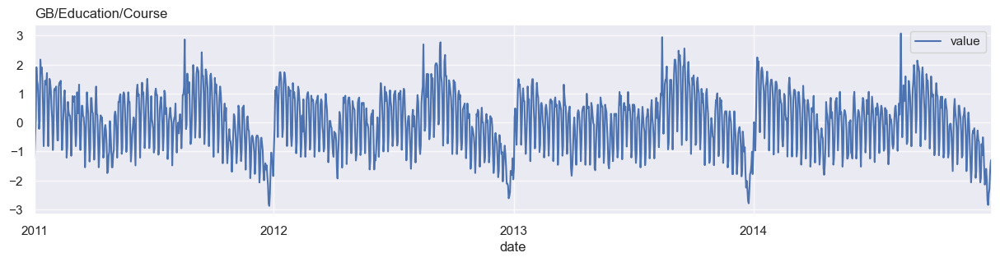

successful
----------------------------------------------------------------------------------------------------
GB/Education/Special education


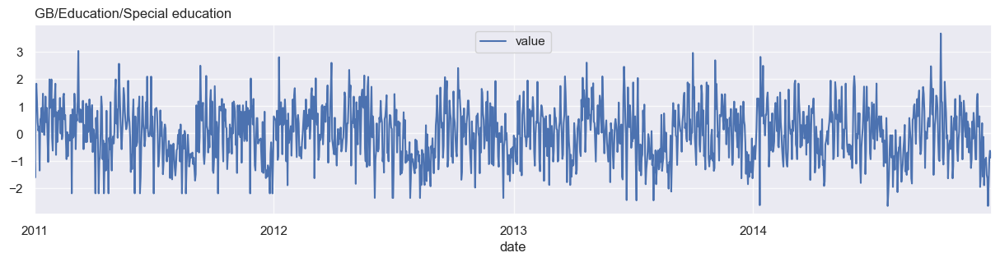

successful
----------------------------------------------------------------------------------------------------
GB/Education/Distance education


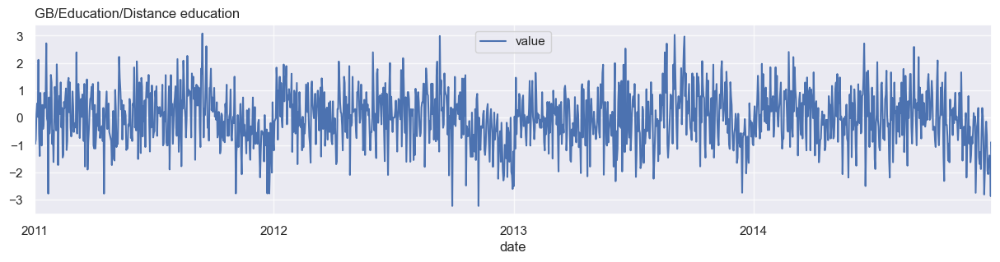

successful
----------------------------------------------------------------------------------------------------
GB/Education/Bachelor's degree


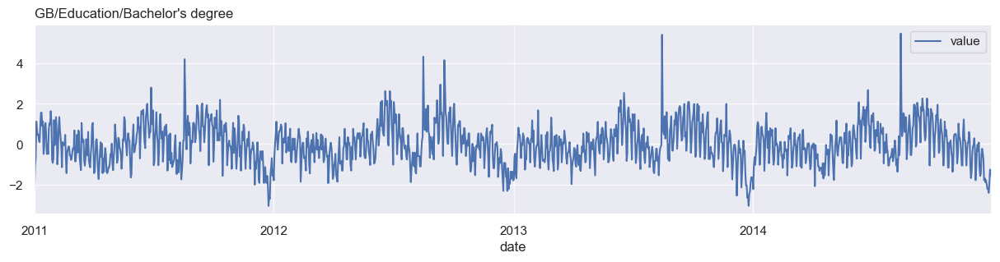

successful
----------------------------------------------------------------------------------------------------
GB/Education/Minister


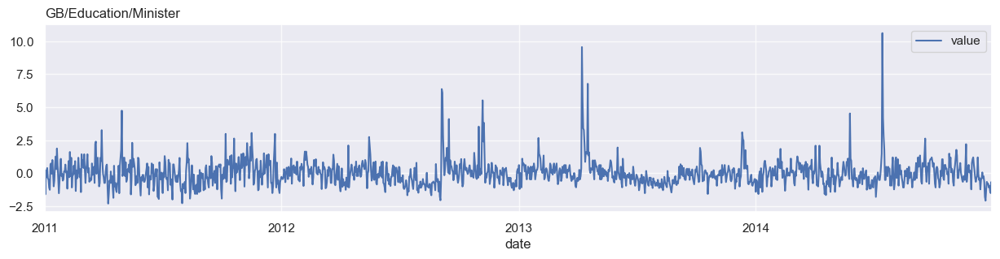

successful
----------------------------------------------------------------------------------------------------
GB/Education/Board of education


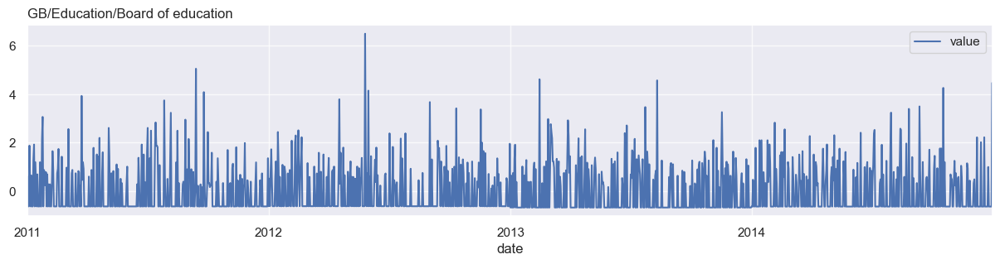

successful
----------------------------------------------------------------------------------------------------
GB/Education/School of education


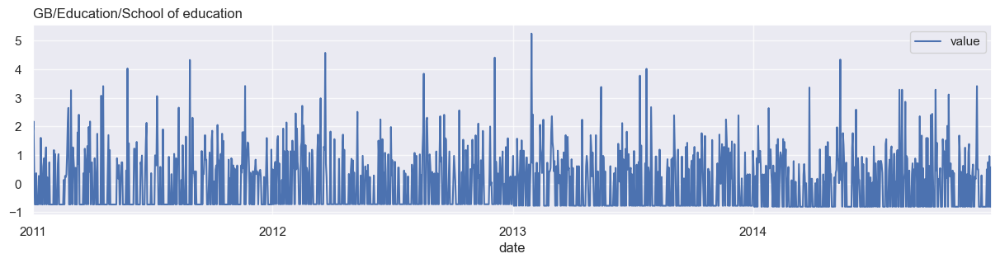

successful
----------------------------------------------------------------------------------------------------
GB/Education/Learning


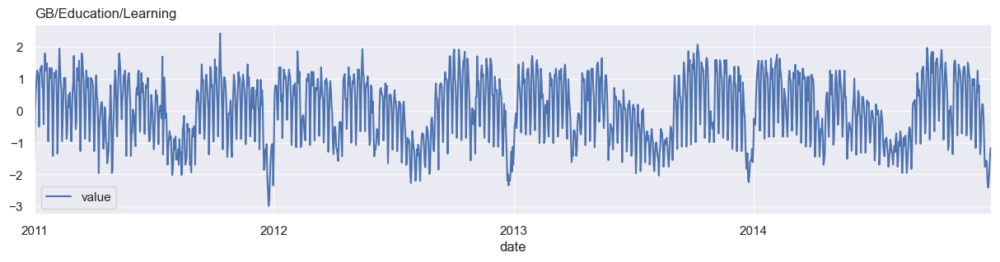

successful
----------------------------------------------------------------------------------------------------
GB/Education/Continuing education


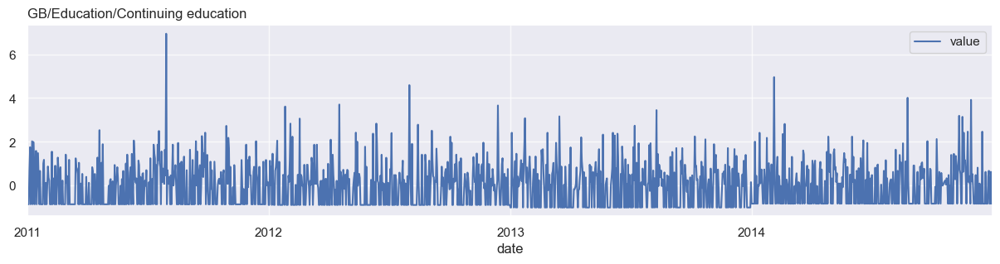

successful
----------------------------------------------------------------------------------------------------
GB/Education/Minecraft: Education Edition


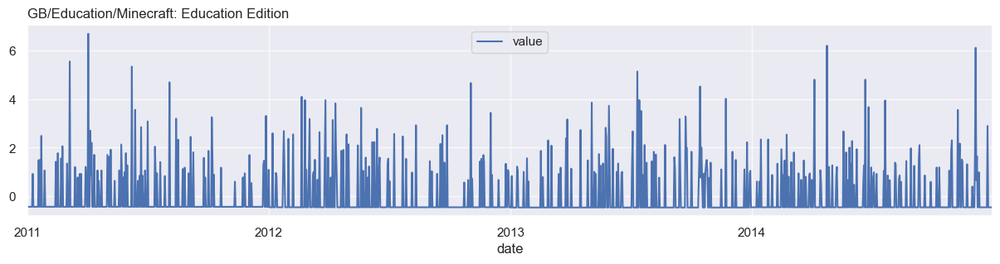

successful
----------------------------------------------------------------------------------------------------
GB/Education/Education minister


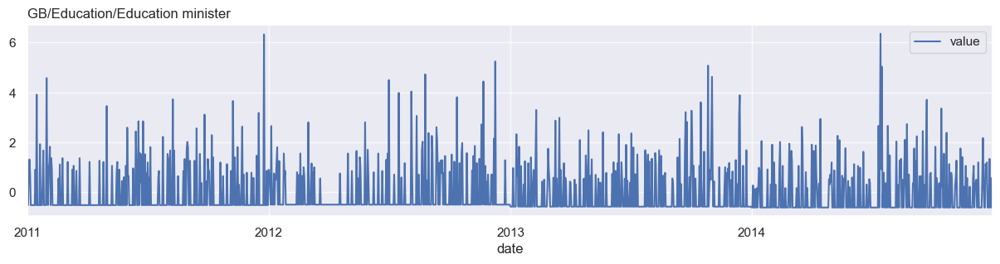

successful
----------------------------------------------------------------------------------------------------
GB/Education/Education policy


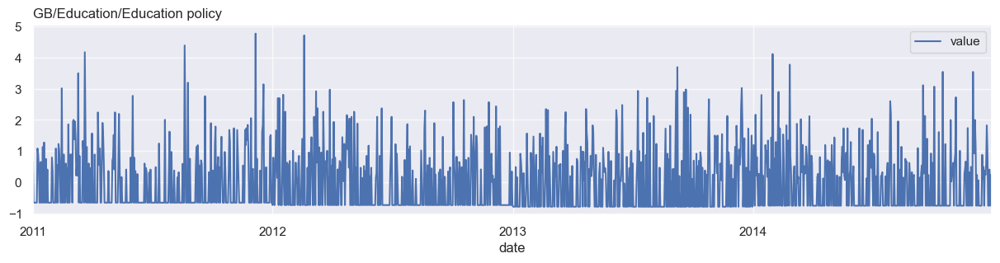

successful
----------------------------------------------------------------------------------------------------
GB/Education/Education Perfect


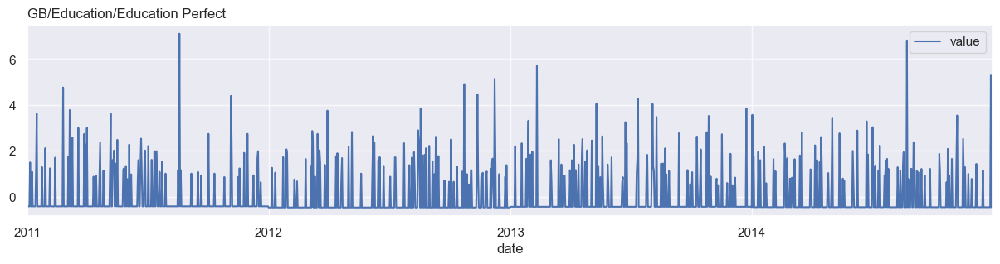

successful
----------------------------------------------------------------------------------------------------
GB/Education/Sex Education - Season 2


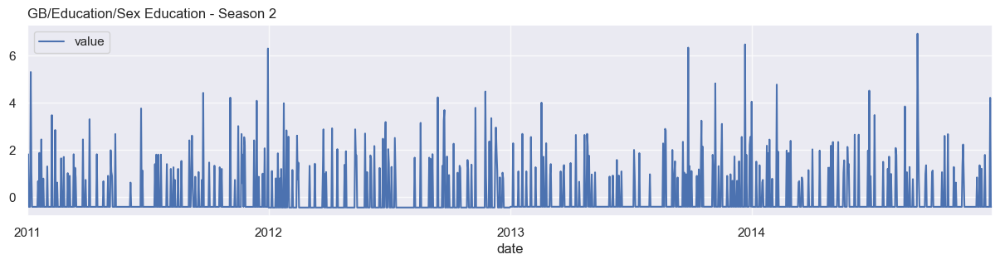

successful
----------------------------------------------------------------------------------------------------
GB/Education/Sex Education - Season 3


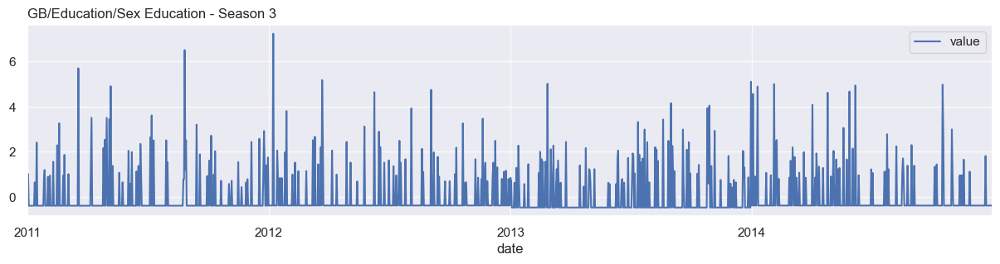

successful
----------------------------------------------------------------------------------------------------
GB/Education/Education Galaxy
error
GB/Education/National Education Policy 2020


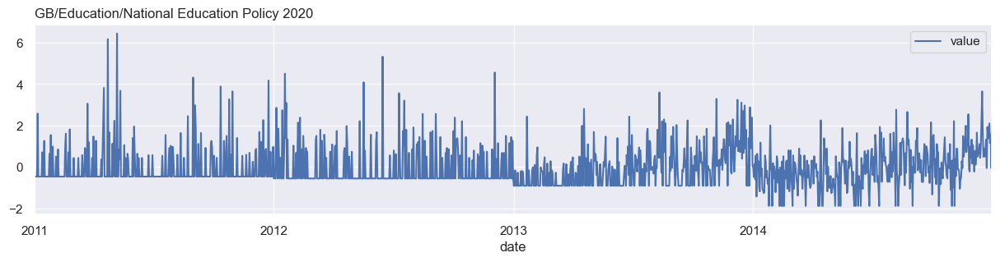

successful
----------------------------------------------------------------------------------------------------
GB/Education/Twelfth Grade


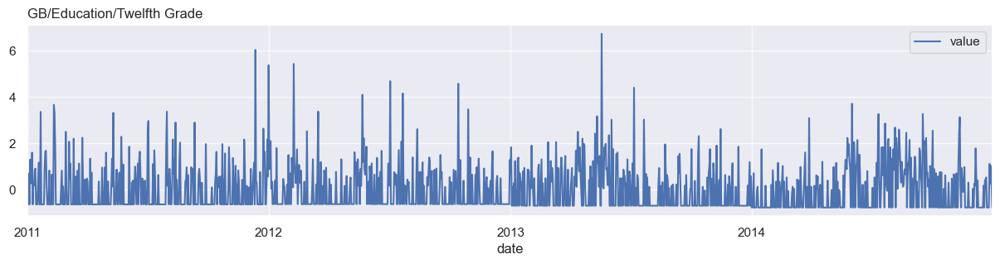

successful
----------------------------------------------------------------------------------------------------
GB/Office/Office


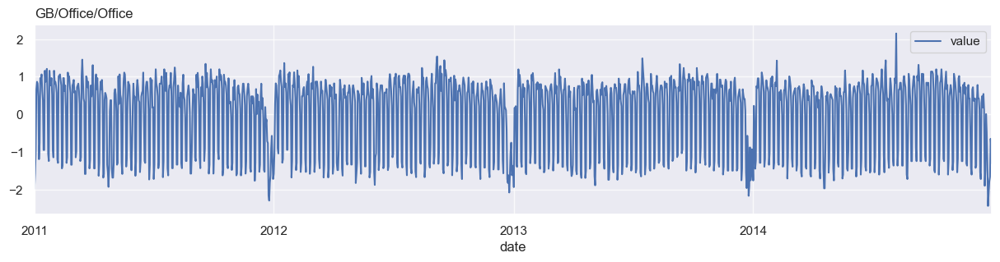

successful
----------------------------------------------------------------------------------------------------
GB/Office/Microsoft 365


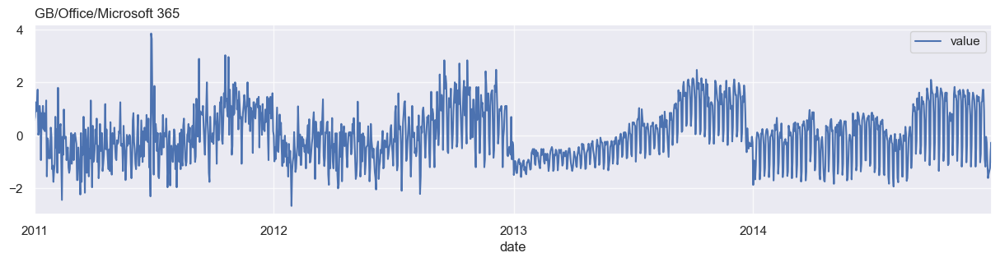

successful
----------------------------------------------------------------------------------------------------
GB/Office/Microsoft Office


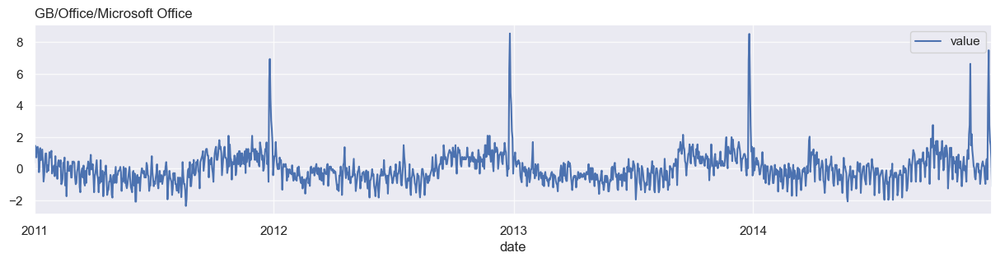

successful
----------------------------------------------------------------------------------------------------
GB/Office/Box office


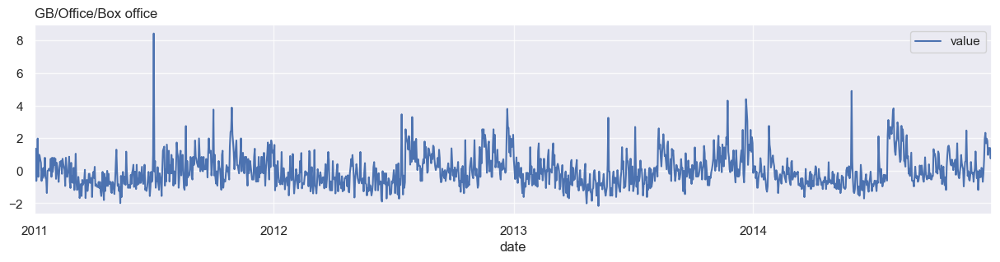

successful
----------------------------------------------------------------------------------------------------
GB/Office/United States Postal Service


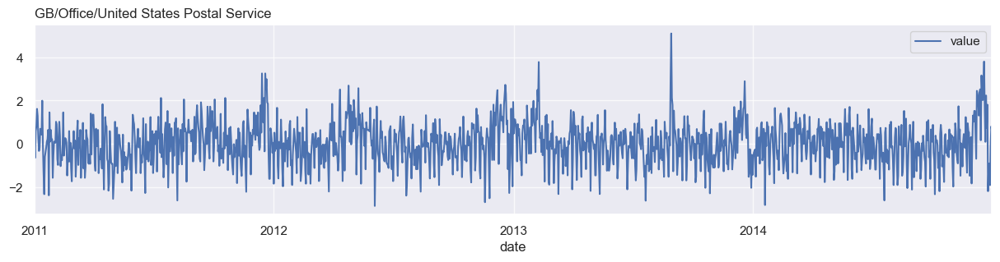

successful
----------------------------------------------------------------------------------------------------
GB/Office/Mail


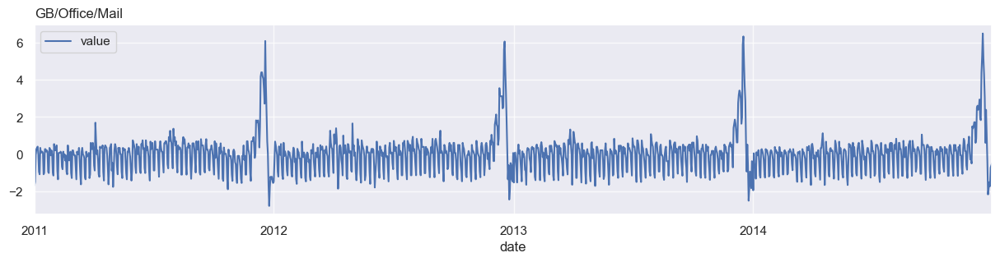

successful
----------------------------------------------------------------------------------------------------
GB/Office/The Office


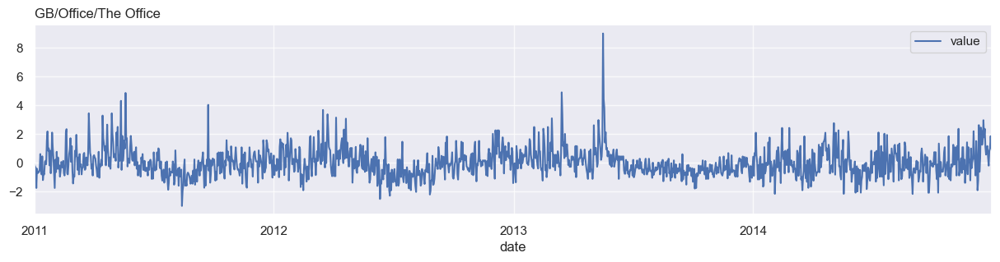

successful
----------------------------------------------------------------------------------------------------
GB/Office/The ODP Corporation


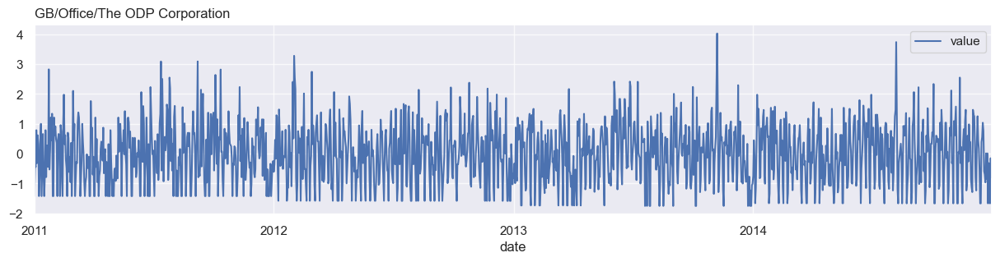

successful
----------------------------------------------------------------------------------------------------
GB/Office/Met Office


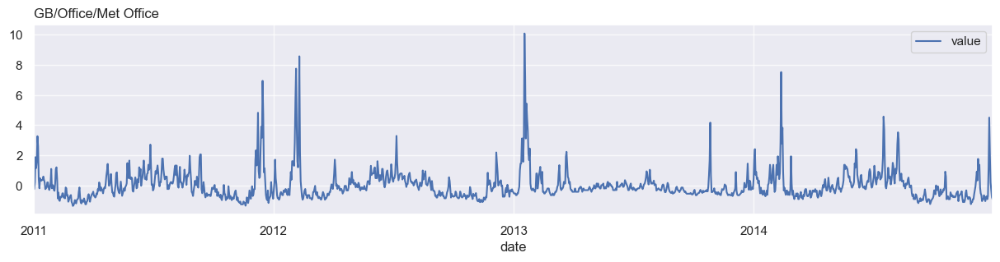

successful
----------------------------------------------------------------------------------------------------
GB/Office/Post Office Limited


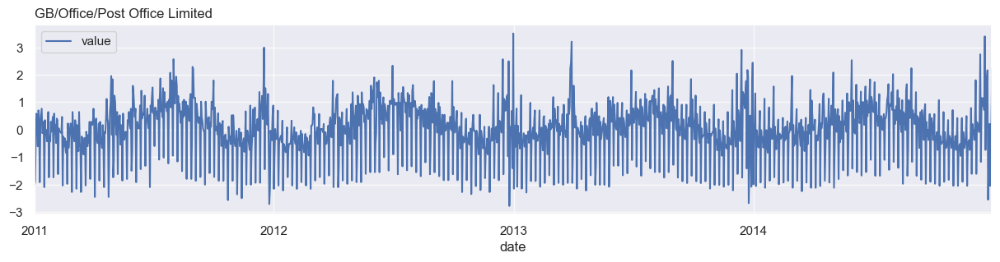

successful
----------------------------------------------------------------------------------------------------
GB/Office/Office suite


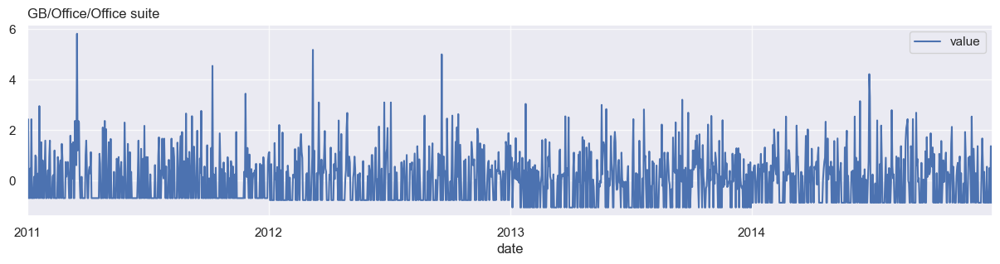

successful
----------------------------------------------------------------------------------------------------
GB/Office/Post office


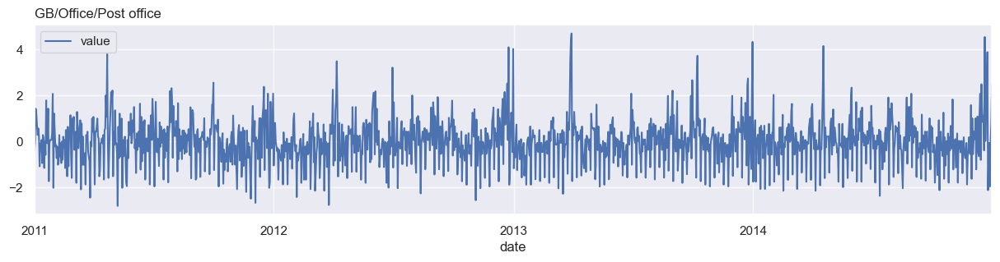

successful
----------------------------------------------------------------------------------------------------
GB/Office/Microsoft 365


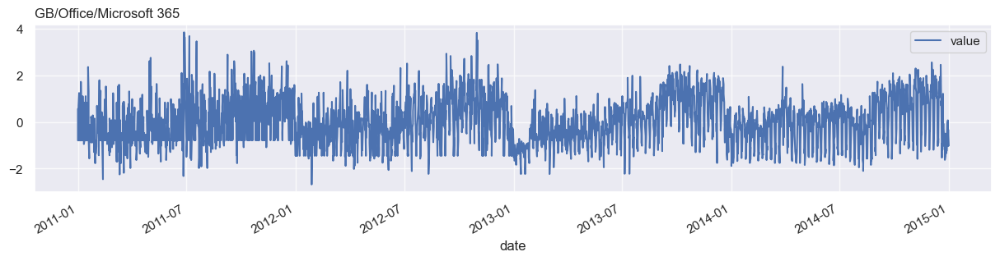

successful
----------------------------------------------------------------------------------------------------
GB/Office/India Post


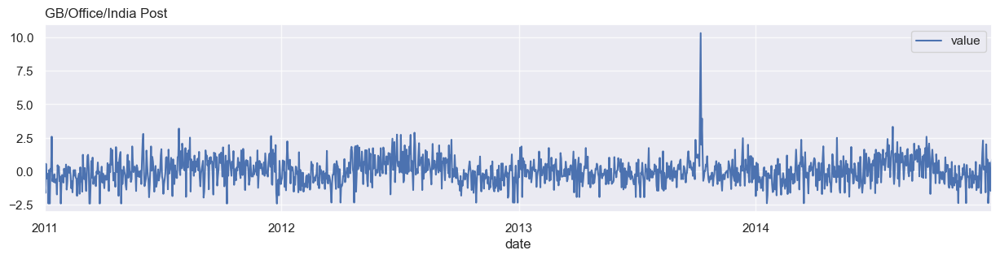

successful
----------------------------------------------------------------------------------------------------
GB/Office/Social Security Administration


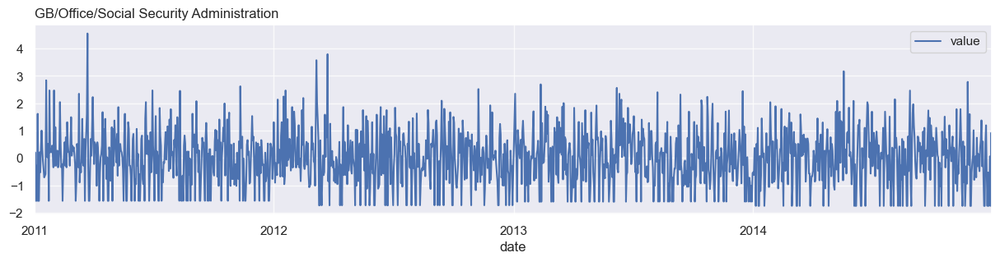

successful
----------------------------------------------------------------------------------------------------
GB/Office/Office chair


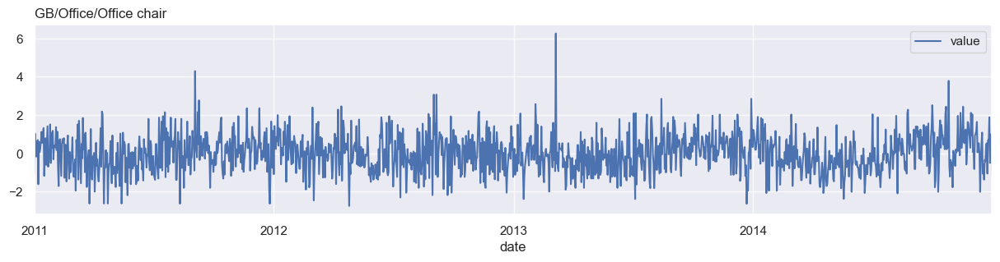

successful
----------------------------------------------------------------------------------------------------
GB/Office/Microsoft


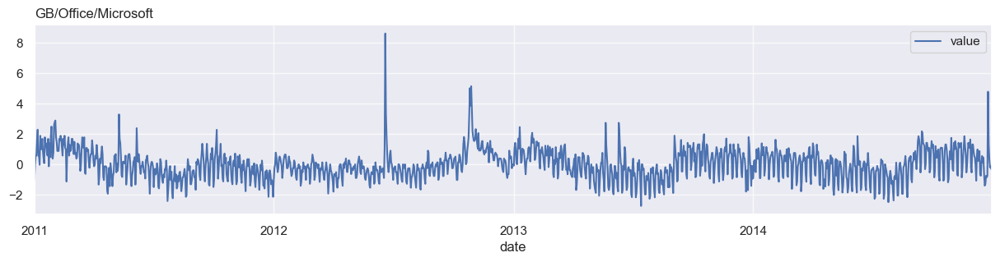

successful
----------------------------------------------------------------------------------------------------
GB/Office/Microsoft Outlook


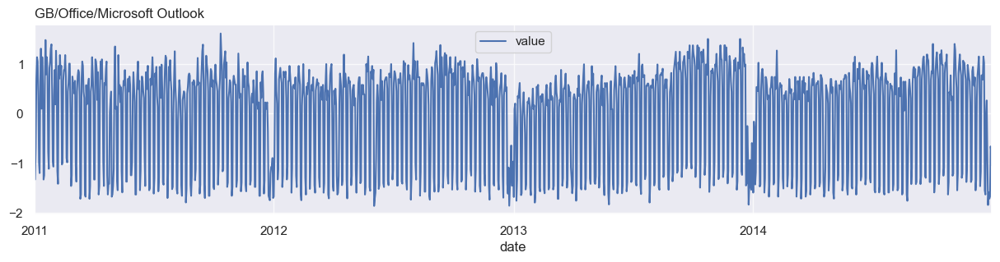

successful
----------------------------------------------------------------------------------------------------
GB/Office/Microsoft Office 2019


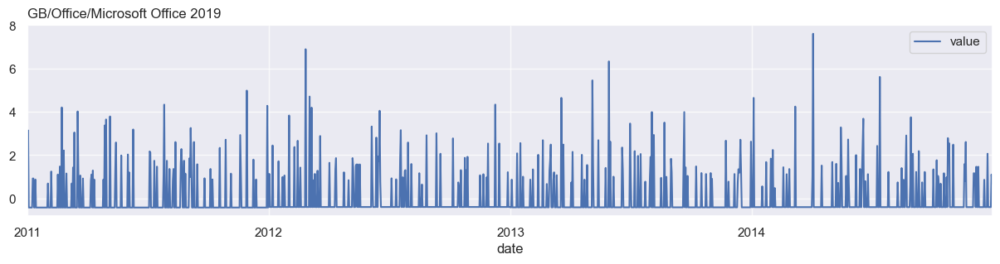

successful
----------------------------------------------------------------------------------------------------
GB/Office/Small office/home office


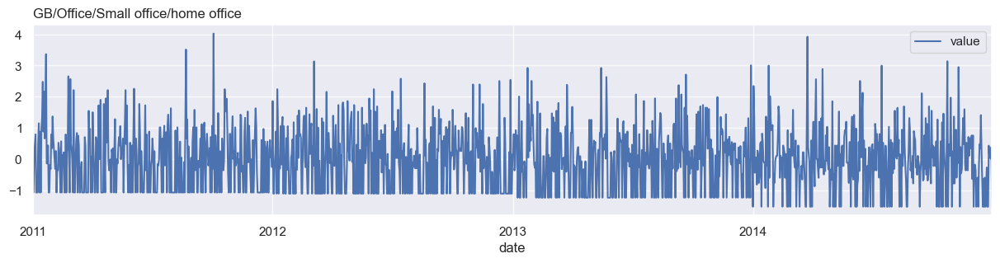

successful
----------------------------------------------------------------------------------------------------
GB/Office/tourism office


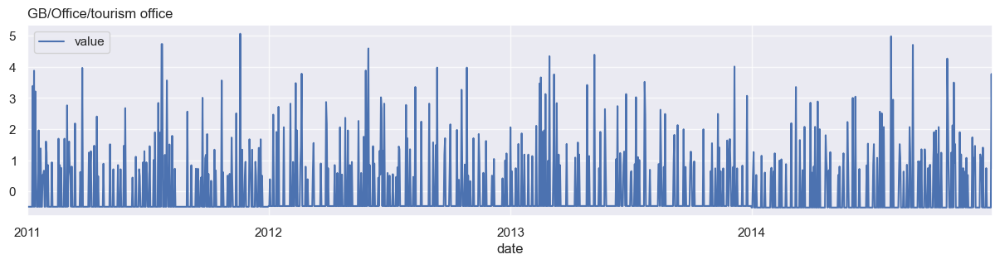

successful
----------------------------------------------------------------------------------------------------
GB/Office/Remote work


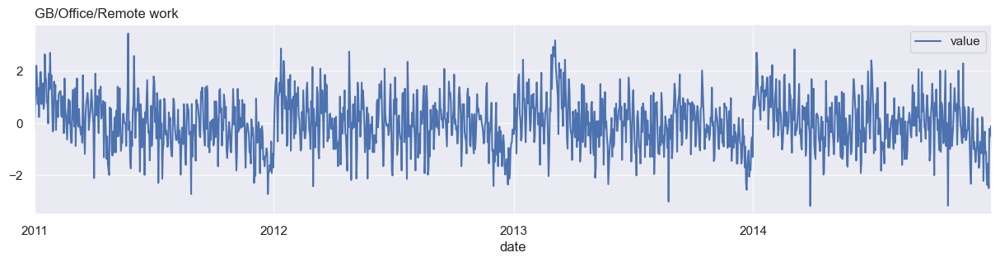

successful
----------------------------------------------------------------------------------------------------


In [5]:
all_trends_GB = download_google_trends(geo_id='GB',     
                           list_primary_use = ['Excel','Education','Office'],
                           start_year=2011,
                           end_year=2014,
                           show_viz=True)

In [6]:
all_trends_GB = all_trends_GB.pivot_table(index='date',columns='title',values='value')
all_trends_GB.index = pd.to_datetime(all_trends_GB.index)
all_trends_GB

title,Bachelor's degree,Board of education,Box office,Calculation,Calendar date,Cell,Chart,College,Column,Computer file,Continuing education,Counting,Course,Data,Distance education,Drop-down list,Drum,Education,Education Perfect,Education minister,Education policy,File format,Formula,Function,Google Sheets,Higher education,India Post,Keyboard shortcut,Learning,List,Macro,Mail,Met Office,Microsoft,Microsoft 365,Microsoft Corporation,Microsoft Excel,Microsoft Office,Microsoft Office 2019,Microsoft Outlook,Microsoft Word,Minecraft: Education Edition,Minister,National Education Policy 2020,Office,Office chair,Office suite,PDF,Physical education,Post Office Limited,Post office,Remote work,Row,School of education,Sex Education,Sex Education - Season 2,Sex Education - Season 3,Small office/home office,Social Security Administration,Special education,Spreadsheet,Student,Table,Teacher,The ODP Corporation,The Office,Twelfth Grade,United States Postal Service,Visual Basic for Applications,tourism office
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2011-01-01,-2.320970,-0.635977,-0.378886,-1.902090,-0.350963,-1.294604,-2.049715,-1.355948,-1.417535,-0.640231,-0.855773,-1.423649,-1.219121,-2.371514,-0.853042,-0.990982,-0.266504,-1.254983,-0.421538,-0.513361,0.648515,-1.349205,-1.437624,-1.247227,-0.692758,-0.670224,-1.120431,-0.102732,-1.422753,-1.941217,-1.050469,-1.681045,-0.246380,-1.019169,-0.115185,-0.706842,-1.709070,0.359120,-0.419424,-1.329339,-2.015789,-0.424227,-0.395133,-0.462628,-1.981404,-1.032943,-0.718261,-2.273309,-0.512165,-2.041322,-0.438838,-0.330607,-1.682451,1.789932,-1.052889,1.583878,-0.399247,-1.070332,-1.570180,-0.632550,-1.248468,-2.063777,-1.161165,-1.180045,-1.423163,-0.101187,-0.658323,-0.063778,-2.010913,-0.497867
2011-01-02,-1.075911,0.596122,0.303408,-1.166623,1.625334,-1.250800,-1.289207,-0.298035,-2.169275,-1.028880,-0.855773,-0.948005,-0.554560,-1.629349,-0.963002,-2.116878,-0.266504,-0.977430,-0.421538,-0.513361,-0.655114,-0.611103,-1.140486,-1.352787,0.387886,-0.610990,-1.641771,-2.324527,0.108239,-1.197541,-2.020111,-1.478403,0.199905,-0.016846,-0.046619,-0.430951,-1.629869,1.457979,3.140138,-1.329339,-1.400567,-0.424227,-1.612463,-0.462628,-1.589019,1.030590,2.411370,-1.776937,-1.051204,-1.862486,-0.008378,0.774459,-2.258287,2.170325,-0.171521,1.812360,1.003273,-1.070332,0.204389,-1.628663,-1.087469,-1.142108,-1.161165,-0.870115,-0.360456,-0.258295,-0.658323,-0.659179,-1.710279,-0.497867
2011-01-03,-0.709717,-0.635977,1.357861,-0.374582,2.811113,-0.987978,0.136746,0.759878,-1.377970,-0.543069,-0.855773,0.098413,0.176457,-1.010878,-0.798062,-2.116878,0.051189,-0.200281,-0.421538,0.809255,-0.655114,-0.242052,-0.546210,-0.824984,-2.236536,-0.137115,0.547858,-0.843330,0.567537,-0.686264,-0.565648,-0.059910,1.873475,0.584547,0.227648,0.856542,-1.194263,1.373451,-0.419424,-0.681429,-0.897203,-0.424227,0.213532,-0.462628,-1.000441,0.406731,-0.718261,-0.784192,-0.512165,-0.133738,1.426490,1.142815,-0.859828,0.411009,-0.612205,-0.415340,-0.399247,0.127191,-1.570180,1.307249,-0.980135,-0.450856,-1.223452,0.369602,-0.445472,-0.336849,0.673705,0.585751,-1.323750,-0.497867
2011-01-04,1.121252,1.873855,-0.626992,0.926628,3.996891,0.326135,0.421937,1.762111,-0.349273,0.622879,0.703457,-0.805311,1.904316,-0.021325,0.136596,-0.855875,-0.690096,1.187484,-0.421538,1.317953,-0.655114,0.311525,0.285776,0.177841,0.284968,-0.077881,-0.546957,-1.045312,0.950285,-0.686264,1.235117,0.277827,1.148261,0.584547,0.056231,0.580651,0.152155,0.697230,-0.419424,0.700780,-0.170121,-0.424227,-0.308181,-0.462628,0.667198,-0.169139,-0.718261,-0.453277,0.633294,0.581606,1.211260,2.186488,-0.818696,-0.730170,-0.832547,-0.415340,-0.399247,0.482013,-0.285147,1.831519,2.078861,0.067582,0.022299,0.555560,0.787268,-1.750822,-0.658323,0.802260,-0.464796,-0.497867
2011-01-05,0.681820,0.322323,0.241381,0.870054,2.712298,0.369938,0.992318,1.483713,0.046379,0.914365,1.754243,0.907008,1.439123,0.658993,0.521455,-0.765803,1

In [7]:
df_holiday = timeanddate_calendar(geo_id='uk',start_year=2011,end_year=2015+1)
df_holiday

,date,holiday_Name,holiday_Type
0,2011-01-01,weekend,weekend
1,2011-01-02,weekend,weekend
2,2011-01-03,New Year's Day observed,Bank Holiday
3,2011-01-04,2nd January (substitute day),Local Bank Holiday
4,2011-01-05,weekday,weekday
...,...,...,...
2183,2016-12-23,weekday,weekday
2184,2016-12-24,weekend,weekend
2185,2016-12-25,weekend,weekend
2186,2016-12-26,Boxing Day,Bank Holiday


In [8]:
df_holiday_encode = df_holiday.copy()
df_holiday_encode[['holiday_Name', 'holiday_Type']] = df_holiday_encode[['holiday_Name', 'holiday_Type']].astype('str').apply(preprocessing.LabelEncoder().fit_transform)
df_holiday_encode.columns = df_holiday_encode.columns+'_encode'
df_holiday_encode = df_holiday_encode.rename(columns={'date_encode':'date'})

### TOU

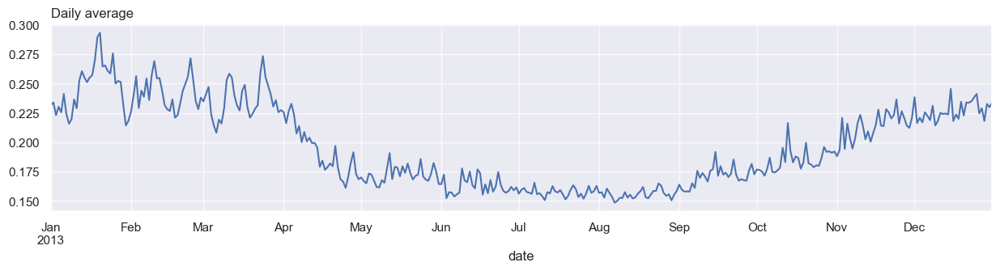

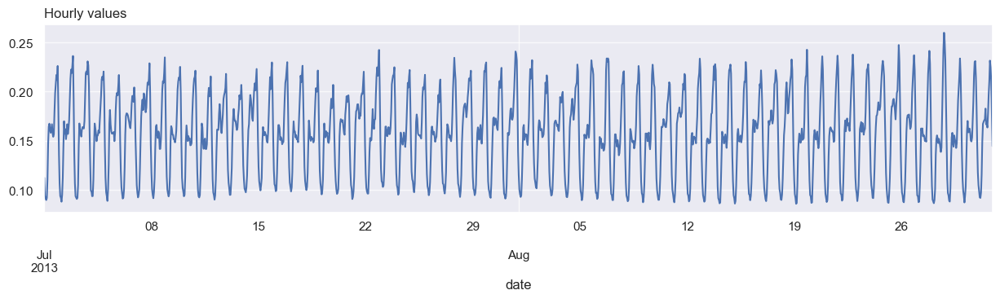

In [9]:
london_tou.mean(axis=1).rename('load').loc['2013'].resample('D').mean().plot(title='Daily average', figsize=(15,3))
plt.show()
london_tou.mean(axis=1).rename('load').loc['2013-07':'2013-08'].plot(title='Hourly values', figsize=(15,3))
plt.show()

In [10]:
df_dataset = london_tou.mean(axis=1).rename('load').to_frame().copy()


index_temp = df_dataset.index.copy()

df_dataset['date'] = pd.to_datetime(df_dataset.index.date)
df_dataset['year'] = df_dataset.index.year.astype('int')
df_dataset['weekday'] = df_dataset.index.weekday
df_dataset['hour'] = df_dataset.index.hour + df_dataset.index.minute/60
df_dataset['timeofweek'] = df_dataset['hour'] + df_dataset['weekday']*24

df_dataset['load_shift24'] = df_dataset['load'].shift(24)
df_dataset['load_shift168'] = df_dataset['load'].shift(168)

df_dataset = df_dataset.merge(london_weather['temp'], left_index=True, right_index=True)
df_dataset['temp_roll24_mean'] = df_dataset['temp'].rolling(24).mean()

df_dataset = df_dataset.merge(df_holiday, on='date')
df_dataset = df_dataset.merge(df_holiday_encode, on='date')
df_dataset = df_dataset.merge(all_trends_GB.reset_index(), on='date')

#df_dataset = df_dataset.drop('date',axis=1)
df_dataset.index = index_temp


df_dataset

,load,date,year,weekday,hour,timeofweek,load_shift24,load_shift168,temp,temp_roll24_mean,holiday_Name,holiday_Type,holiday_Name_encode,holiday_Type_encode,Bachelor's degree,Board of education,Box office,Calculation,Calendar date,Cell,Chart,College,Column,Computer file,Continuing education,Counting,Course,Data,Distance education,Drop-down list,Drum,Education,Education Perfect,Education minister,Education policy,File format,Formula,Function,Google Sheets,Higher education,India Post,Keyboard shortcut,Learning,List,Macro,Mail,Met Office,Microsoft,Microsoft 365,Microsoft Corporation,Microsoft Excel,Microsoft Office,Microsoft Office 2019,Microsoft Outlook,Microsoft Word,Minecraft: Education Edition,Minister,National Education Policy 2020,Office,Office chair,Office suite,PDF,Physical education,Post Office Limited,Post office,Remote work,Row,School of education,Sex Education,Sex Education - Season 2,Sex Education - Season 3,Small office/home office,Social Security Administration,Special education,Spreadsheet,Student,Table,Teacher,The ODP Corporation,The Office,Twelfth Grade,United States Postal Service,Visual Basic for Applications,tourism office
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2011-11-23 09:00:00,0.180500,2011-11-23,2011,2,9.0,57.0,NaN,NaN,5.0,NaN,weekday,weekday,45,5,-0.085650,-0.636042,0.722376,1.216560,-0.021923,1.630500,0.908208,0.882256,0.454460,0.138007,-0.857900,1.784165,-0.231554,0.558051,-0.43029,1.332591,0.429787,0.932415,-0.420263,-0.512039,1.351750,0.647870,1.131766,0.793276,-0.948482,-0.302230,0.659634,-0.494165,0.803190,0.260339,0.527236,0.253465,-1.163015,-0.104313,0.934121,0.197143,1.203032,1.238571,-0.419241,0.625547,1.552859,0.779759,1.012086,-0.461468,0.813129,0.278375,-0.719096,1.306936,0.711948,-0.320616,-0.058316,-0.234176,1.767082,1.139166,-1.056525,1.797741,-0.398399,0.406738,0.107434,0.331290,1.388136,0.365712,1.281307,1.084961,0.518266,0.020598,-0.658113,1.049460,1.296057,-0.498235
2011-11-23 10:00:00,0.088750,2011-11-23,2011,2,10.0,58.0,NaN,NaN,5.0,NaN,weekday,weekday,45,5,-0.085650,-0.636042,0.722376,1.216560,-0.021923,1.630500,0.908208,0.882256,0.454460,0.138007,-0.857900,1.784165,-0.231554,0.558051,-0.43029,1.332591,0.429787,0.932415,-0.420263,-0.512039,1.351750,0.647870,1.131766,0.793276,-0.948482,-0.302230,0.659634,-0.494165,0.803190,0.260339,0.527236,0.253465,-1.163015,-0.104313,0.934121,0.197143,1.203032,1.238571,-0.419241,0.625547,1.552859,0.779759,1.012086,-0.461468,0.813129,0.278375,-0.719096,1.306936,0.711948,-0.320616,-0.058316,-0.234176,1.767082,1.139166,-1.056525,1.797741,-0.398399,0.406738,0.107434,0.331290,1.388136,0.365712,1.281307,1.084961,0.518266,0.020598,-0.658113,1.049460,1.296057,-0.498235
2011-11-23 11:00:00,0.101250,2011-11-23,2011,2,11.0,59.0,NaN,NaN,7.0,NaN,weekday,weekday,45,5,-0.085650,-0.636042,0.722376,1.216560,-0.021923,1.630500,0.908208,0.882256,0.454460,0.138007,-0.857900,1.784165,-0.231554,0.558051,-0.43029,1.332591,0.429787,0.932415,-0.420263,-0.512039,1.351750,0.647870,1.131766,0.793276,-0.948482,-0.302230,0.659634,-0.494165,0.803190,0.260339,0.527236,0.253465,-1.163015,-0.104313,0.934121,0.197143,1.203032,1.238571,-0.419241,0.625547,1.552859,0.779759,1.012086,-0.461468,0.813129,0.278375,-0.719096,1.306936,0.711948,-0.320616,-0.058316,-0.234176,1.767082,1.139166,-1.056525,1.797741,-0.398399,0.406738,0.107434,0.331290,1.388136,0.365712,1.281307,1.084961,0.518266,0.020598,-0.658113,1.049460,1.296057,-0.498235
2011-11-23 12:00:00,0.162500,2011-11-23,2011,2,12.0,60.0,NaN,NaN,8.0,NaN,weekday,weekday,45,5,-0.085650,-0.636042,0.722376,1.216560,-0.021923,1.630500,0.908208,0.882256,0.454460,0.138007,-0.857900,1.784165,-0.231554,0.558051,-0.43029,1.332591,0.429787,0.932415,-0.420263,-0.512039,1.351750,0.647870,1.131766,0.793276,-0.948482,-0.302230,0.659634,-0.494165,0.803190,0.260339,0.527236,0.253465,-1.163015,-0.104313,0.934121,0.197143,1.203032,1.238571,-0.419241,0.625547,1.552859,0.779759,1.012086,-0.461468,0.813129,0.27

## 1st model: temporal feature + weather feature

C:\Users\user\anaconda3\lib\site-packages\pandas\plotting\_matplotlib\core.py:1114: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  scatter = ax.scatter(


<AxesSubplot: xlabel='timeofweek', ylabel='load'>

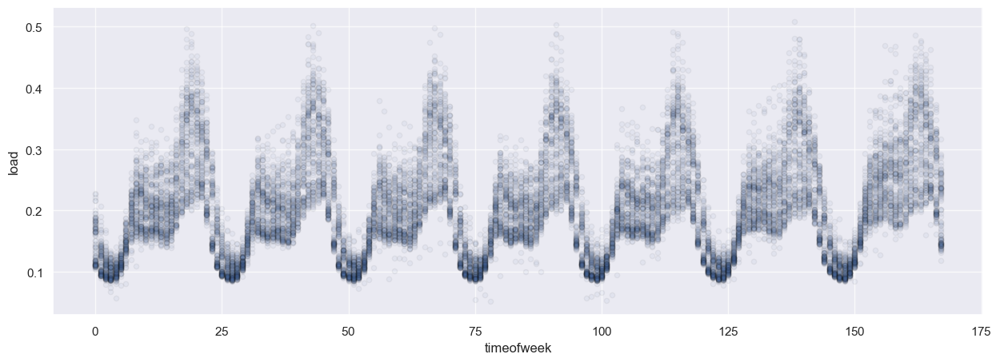

In [11]:
df_dataset.plot(kind='scatter',x='timeofweek',y='load', figsize=(15,5),alpha=0.05)

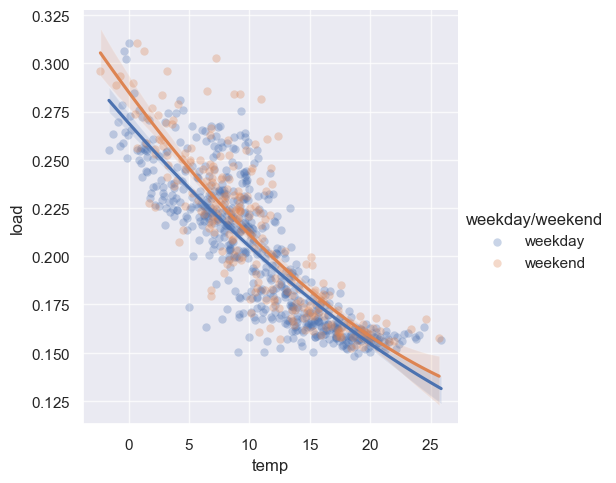

In [12]:
# Scatter plot for demand and outdoor temperature
df_plot = df_dataset.resample('D').mean().copy()
df_plot['weekday/weekend'] = 'weekday'
df_plot.loc[df_plot['weekday']>4, 'weekday/weekend'] ='weekend'

sns.lmplot(x='temp', y='load', hue="weekday/weekend",
           data=df_plot, order=2, scatter_kws={'alpha':0.3})

In [13]:
list_feat = ['weekday','hour','temp', 'temp_roll24_mean']

Model: LGBM
R SQUARED: 0.8657
MAE: 0.019


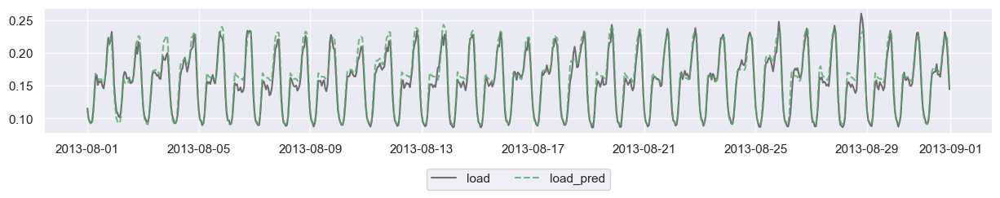

In [14]:
traindata = df_dataset.loc[:'2012'].copy()
testdata = df_dataset.loc['2013':].copy()

LGB_model = lgb.LGBMRegressor()
LGB_model.fit(traindata[list_feat], traindata['load'])
testdata['load_pred'] = LGB_model.predict(testdata[list_feat])
errors = abs(testdata['load_pred'] - testdata['load'])
RSQUARED = r2_score(testdata['load'], testdata['load_pred'])
MAE = mean_absolute_error(testdata['load'], testdata['load_pred'])

print("Model: LGBM")
print("R SQUARED: "+str(round(RSQUARED,4)))
print("MAE: "+str(round(MAE,4)))

plt.figure(figsize=(15,2))
plt.plot(testdata.loc['2013-8'].index, testdata.loc['2013-8','load'], '-k', alpha=0.6, label='load')
plt.plot(testdata.loc['2013-8'].index, testdata.loc['2013-8','load_pred'], '--g', alpha=0.8, label='load_pred')
plt.legend(loc='lower center', ncol=3, bbox_to_anchor=(0.5, -0.5))

## 2nd model: add calendar data

In [15]:
list_feat = ['weekday','hour','temp', 'temp_roll24_mean',
             'holiday_Name_encode','holiday_Type_encode']

Model: LGBM
R SQUARED: 0.8665
MAE: 0.019


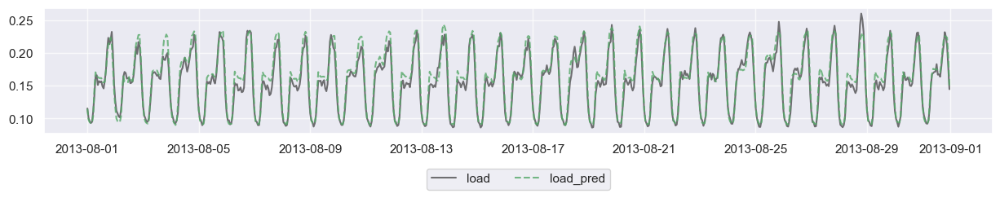

In [16]:
traindata = df_dataset.loc[:'2012'].copy()
testdata = df_dataset.loc['2013':].copy()

LGB_model = lgb.LGBMRegressor()
LGB_model.fit(traindata[list_feat], traindata['load'])
testdata['load_pred'] = LGB_model.predict(testdata[list_feat])
errors = abs(testdata['load_pred'] - testdata['load'])
RSQUARED = r2_score(testdata['load'], testdata['load_pred'])
MAE = mean_absolute_error(testdata['load'], testdata['load_pred'])

print("Model: LGBM")
print("R SQUARED: "+str(round(RSQUARED,4)))
print("MAE: "+str(round(MAE,4)))

plt.figure(figsize=(15,2))
plt.plot(testdata.loc['2013-8'].index, testdata.loc['2013-8','load'], '-k', alpha=0.6, label='load')
plt.plot(testdata.loc['2013-8'].index, testdata.loc['2013-8','load_pred'], '--g', alpha=0.8, label='load_pred')
plt.legend(loc='lower center', ncol=3, bbox_to_anchor=(0.5, -0.5))

## 3rd model: add lag features

In [17]:
list_feat = ['weekday','hour','temp', 'temp_roll24_mean',
             'holiday_Name_encode','holiday_Type_encode',
             'load_shift24', 'load_shift168']

Model: LGBM
R SQUARED: 0.9535
MAE: 0.011


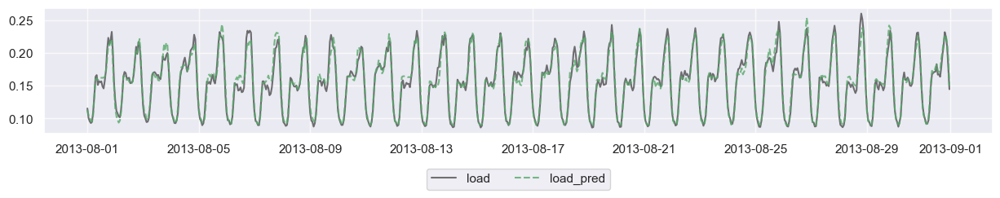

In [18]:
traindata = df_dataset.loc[:'2012'].copy()
testdata = df_dataset.loc['2013':].copy()

LGB_model = lgb.LGBMRegressor()
LGB_model.fit(traindata[list_feat], traindata['load'])
testdata['load_pred'] = LGB_model.predict(testdata[list_feat])
errors = abs(testdata['load_pred'] - testdata['load'])
RSQUARED = r2_score(testdata['load'], testdata['load_pred'])
MAE = mean_absolute_error(testdata['load'], testdata['load_pred'])

print("Model: LGBM")
print("R SQUARED: "+str(round(RSQUARED,4)))
print("MAE: "+str(round(MAE,4)))

plt.figure(figsize=(15,2))
plt.plot(testdata.loc['2013-8'].index, testdata.loc['2013-8','load'], '-k', alpha=0.6, label='load')
plt.plot(testdata.loc['2013-8'].index, testdata.loc['2013-8','load_pred'], '--g', alpha=0.8, label='load_pred')
plt.legend(loc='lower center', ncol=3, bbox_to_anchor=(0.5, -0.5))

## 4rd model: add google trends data

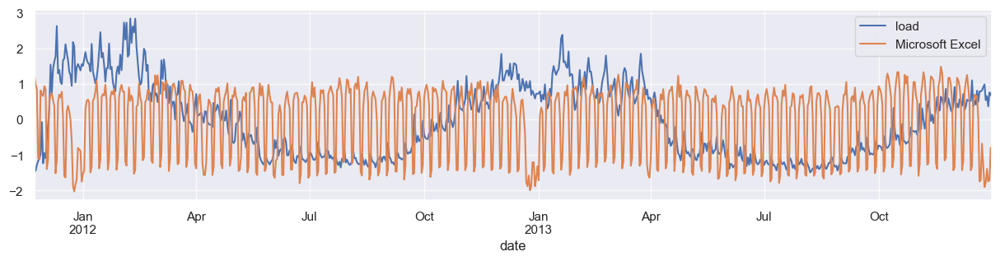

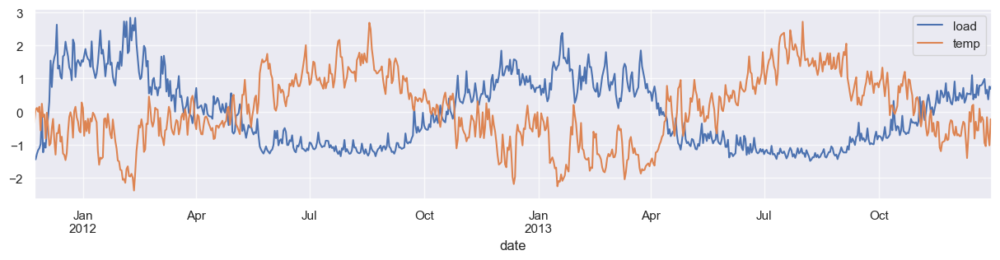

In [19]:
df_plot = df_dataset.resample('D').mean()
df_plot = (df_plot-df_plot.mean())/df_plot.std()
df_plot[['load','Microsoft Excel']].loc[:'2013'].plot(figsize=(15,3))
plt.show()
df_plot[['load','temp']].loc[:'2013'].plot(figsize=(15,3))
plt.show()

In [20]:
list_feat = ['weekday','hour','temp', 'temp_roll24_mean',
             'holiday_Name_encode','holiday_Type_encode',
             'load_shift24', 'load_shift168',
             'Microsoft Excel', 'Education']

Model: LGBM
R SQUARED: 0.9532
MAE: 0.0112


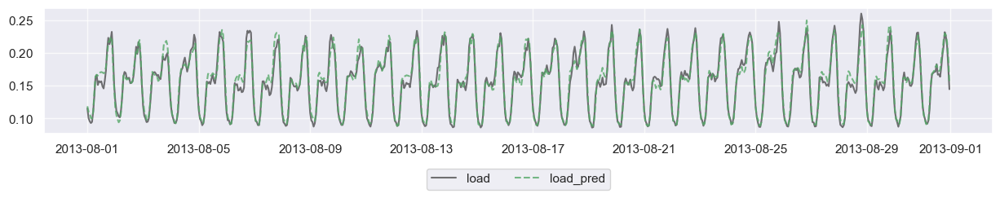

In [21]:
traindata = df_dataset.loc[:'2012'].copy()
testdata = df_dataset.loc['2013':].copy()

LGB_model = lgb.LGBMRegressor()
LGB_model.fit(traindata[list_feat], traindata['load'])
testdata['load_pred'] = LGB_model.predict(testdata[list_feat])
errors = abs(testdata['load_pred'] - testdata['load'])
RSQUARED = r2_score(testdata['load'], testdata['load_pred'])
MAE = mean_absolute_error(testdata['load'], testdata['load_pred'])

print("Model: LGBM")
print("R SQUARED: "+str(round(RSQUARED,4)))
print("MAE: "+str(round(MAE,4)))

plt.figure(figsize=(15,2))
plt.plot(testdata.loc['2013-8'].index, testdata.loc['2013-8','load'], '-k', alpha=0.6, label='load')
plt.plot(testdata.loc['2013-8'].index, testdata.loc['2013-8','load_pred'], '--g', alpha=0.8, label='load_pred')
plt.legend(loc='lower center', ncol=3, bbox_to_anchor=(0.5, -0.5))